### VGGNet Modeling

#### 학습 및 테스트 데이터 생성(oxford-pet)

In [1]:
import numpy as np
import pandas as pd
import random
import matplotlib.pyplot as plt
import torchvision
import torchvision.transforms as transforms
import torch
from torch.utils.data import random_split

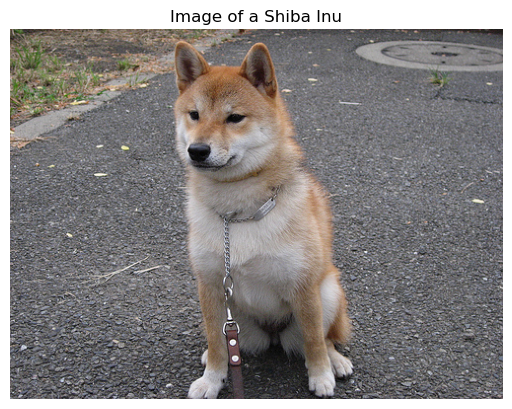

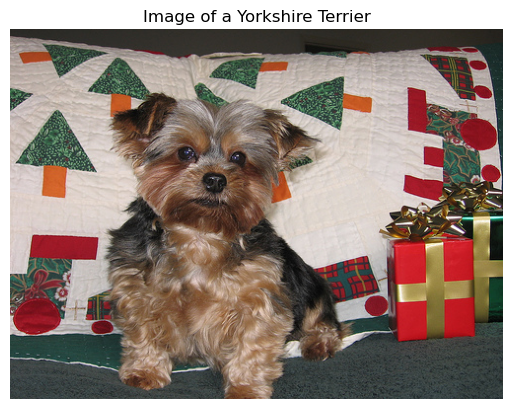

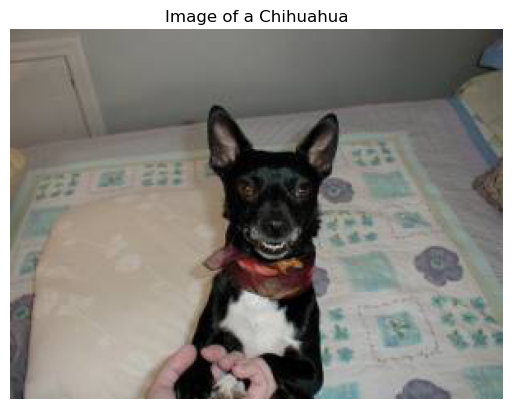

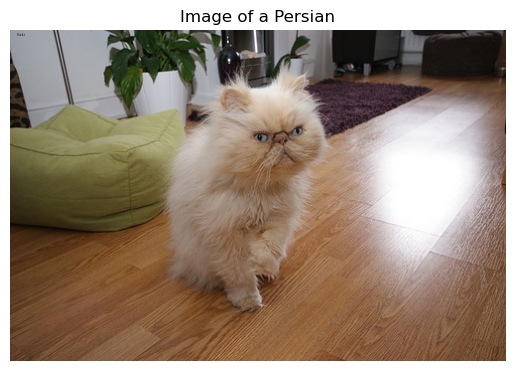

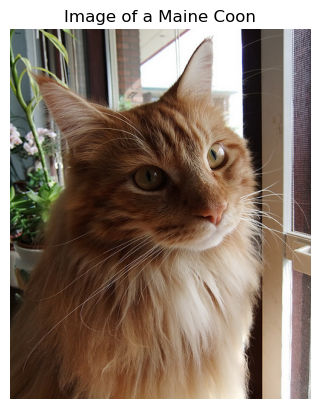

In [2]:
# data 불러오기
pet_data = torchvision.datasets.OxfordIIITPet(root="./data",split="trainval",download=True)

for i in range(5):
    image, label = pet_data[random.choice(range(len(pet_data)))]

    fig = plt.figure()
    plt.imshow(image)
    plt.title(f"Image of a {pet_data.classes[label]}")
    plt.axis("off")

In [3]:
# 데이터 transform 형태 정의
train_transform = transforms.Compose([
    transforms.Resize((256,256)),
    transforms.CenterCrop(224),
    # transforms.RandAugment(),
    transforms.ToTensor(),
])
test_transform = transforms.Compose([
    transforms.Resize((256,256)),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
])

# train & test 데이터 생성
train_dataset = torchvision.datasets.OxfordIIITPet(root="./data", split="trainval", transform=train_transform, download=False)
test_dataset = torchvision.datasets.OxfordIIITPet(root="./data", split="test",transform=test_transform, download=False)

# train data 라벨(=class) 및 배치 크기 정의
classes = train_dataset.classes
num_classes = len(classes)
BATCH_SIZE = 64

# 학습에 대한 validation 데이터 정의
split_len = int(0.9*len(train_dataset))
train_dataset, val_dataset = random_split(train_dataset, [split_len, len(train_dataset)-split_len], generator=torch.Generator().manual_seed(7))

# train, val, test 데이터 갯수 확인
print('Length of train dataset: ', len(train_dataset))
print('Length of validation dataset: ', len(val_dataset))
print('Numuber of class in train dataset: ', num_classes)
print('Length of test dataset: ', len(test_dataset))

Length of train dataset:  3312
Length of validation dataset:  368
Numuber of class in train dataset:  37
Length of test dataset:  3669


In [4]:
train_dataloader = torch.utils.data.DataLoader(train_dataset, shuffle=True, persistent_workers=True, num_workers=1, batch_size=BATCH_SIZE)
val_dataloader = torch.utils.data.DataLoader(val_dataset, shuffle=False, persistent_workers=True, num_workers=1, batch_size=BATCH_SIZE)
test_dataloader = torch.utils.data.DataLoader(val_dataset, shuffle=False, persistent_workers=True, num_workers=1, batch_size=BATCH_SIZE)

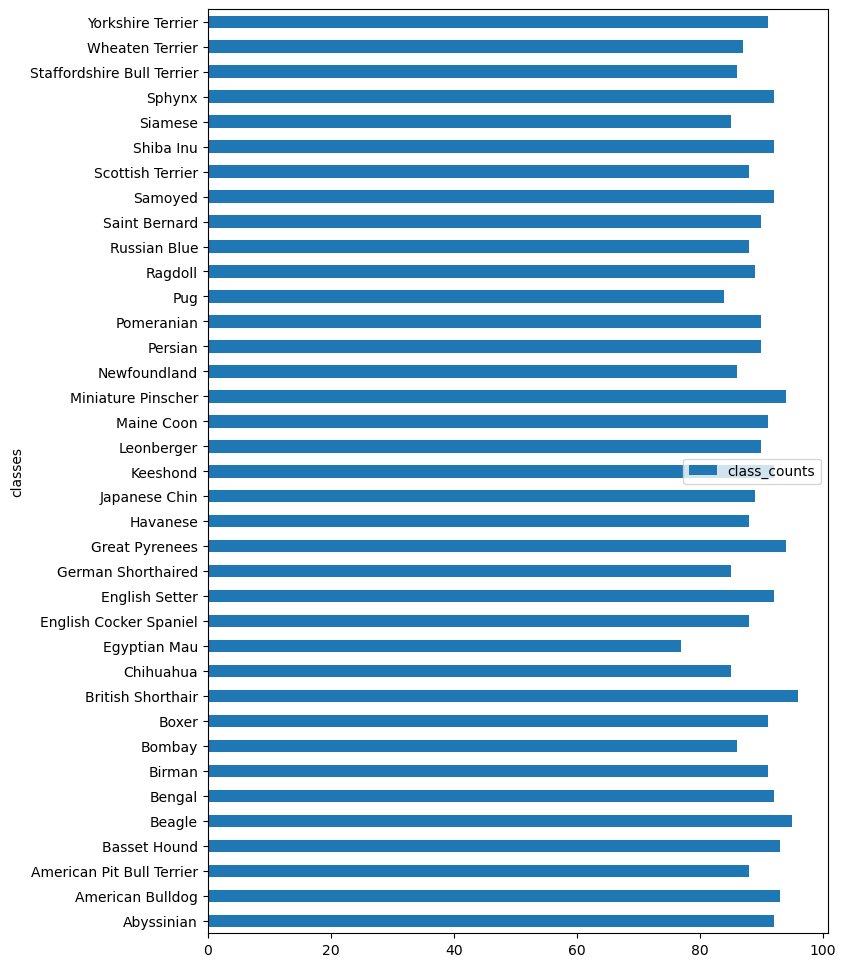

In [5]:
class_counts = np.array([0]*num_classes)

for batch in train_dataloader:
    _, labels = batch

    for label in labels:
        class_counts[label] += 1

df_classes = pd.DataFrame({"classes" : classes, "class_counts" : class_counts})

df_classes.plot(kind="barh", x="classes", y="class_counts",figsize=(8,12))
plt.show()

#### 모델 생성

##### 1. 모델 구축

In [6]:
# pip install pytorch_lightning

In [7]:
import torch.nn as nn
import torch.nn.functional as F
from torchsummary import summary
from torch import optim

from pytorch_lightning import LightningModule, Trainer, seed_everything
from torchmetrics import MetricCollection, Accuracy, F1Score
from torch.optim.lr_scheduler import StepLR

In [8]:
# Define VGG type dict
# int : output channels after conv layer
# M : max pooling layer
seed_everything(2023, workers=True)

VGG_types = {
    'VGG11' : [64, 'M', 128, 'M', 256, 256, 'M', 512,512, 'M',512,512,'M'],
    'VGG13' : [64,64, 'M', 128, 128, 'M', 256, 256, 'M', 512,512, 'M', 512,512,'M'],
    'VGG16' : [64,64, 'M', 128, 128, 'M', 256, 256,256, 'M', 512,512,512, 'M',512,512,512,'M'],
    'VGG19' : [64,64, 'M', 128, 128, 'M', 256, 256,256,256, 'M', 512,512,512,512, 'M',512,512,512,512,'M']
}


# Define VGGNet Class
class VGGNet(LightningModule):
    def __init__(self, model, in_channels=3, num_classes=10, learning_rate=0.001, init_weights=True):
        super().__init__()
        self.save_hyperparameters()
        self.in_channels = in_channels

        # Setup VGGNet model
        self.create_model(model)

        # Setup the loss
        self.loss = nn.CrossEntropyLoss()

        # Setup the metrics.
        self.train_metrics = MetricCollection({"train_acc" : Accuracy(task="multiclass", num_classes=num_classes, average="micro"),
                                               "train_f1" : F1Score(task="multiclass", num_classes=num_classes, average="macro")})
        self.val_metrics = MetricCollection({"val_acc" : Accuracy(task="multiclass", num_classes=num_classes, average="micro"),
                                               "val_f1" : F1Score(task="multiclass", num_classes=num_classes, average="macro")})
        self.test_metrics = MetricCollection({"test_acc" : Accuracy(task="multiclass", num_classes=num_classes, average="micro"),
                                               "test_f1" : F1Score(task="multiclass", num_classes=num_classes, average="macro")})

        # weight initialization
        if init_weights:
            self._initialize_weights()

    # Define a function to create conv layers taken the key of VGG_type dict
    def create_conv_layers(self, architecture):
        layers = []
        in_channels = self.in_channels # 3
        for x in architecture:
            if type(x) == int: # int means conv layer
                out_channels = x
                layers += [
                    nn.Conv2d(in_channels=in_channels, out_channels=out_channels,
                              kernel_size=(3,3), stride=(1,1), padding=(1,1)),
                    nn.BatchNorm2d(x),
                    nn.ReLU()
                ]
                in_channels = x
            elif x == 'M':
                layers += [nn.MaxPool2d(kernel_size=(2,2), stride=(2,2))]
        return nn.Sequential(*layers)

    # Define a function to create VGGNet Model
    def create_model(self, model):
        # Create feature_extractor corresponding to VGG type
        self.feature_extractor = self.create_conv_layers(VGG_types[model])
        self.avg_pool = nn.AdaptiveAvgPool2d(output_size=(7, 7))
        # Create classifier
        self.classifier = nn.Sequential(
            nn.Linear(512*7*7, 4096),
            nn.ReLU(),
            nn.Dropout(),
            nn.Linear(4096,4096),
            nn.ReLU(),
            nn.Dropout(),
            nn.Linear(4096, num_classes),
        )

    # Define weight initialization function
    def _initialize_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
                if m.bias is not None:
                    nn.init.constant_(m.bias, 0)
                elif isinstance(m, nn.BatchNorm2d):
                    nn.init.constant_(m.weight, 1)
                    nn.init.constant_(m.bias, 0)
                elif isinstance(m, nn.Linear):
                    nn.init.normal_(m.weight, 0, 0.01)
                    nn.init.constant_(m.bias, 0)

    def forward(self, x):
        x = self.feature_extractor(x)
        x = self.avg_pool(x)
        x = x.view(-1, 512 * 7 * 7)
        x = self.classifier(x)
        return x

    def training_step(self, batch, batch_idx):
        images, labels = batch

        logits = self(images)
        preds = torch.argmax(logits, dim=1)
        loss = self.loss(logits, labels)

        self.train_metrics(preds, labels)

        self.log("train_acc", self.train_metrics["train_acc"], prog_bar=True)
        self.log("train_f1", self.train_metrics["train_f1"], prog_bar=True)
        self.log("train_loss", loss, prog_bar=True)

        return loss

    def evaluate(self, batch, stage=None):
        images, labels = batch

        logits = self(images)
        preds = torch.argmax(logits, dim=1)
        loss = self.loss(logits,labels)

        if stage == "val":
            self.val_metrics(preds,labels)

            self.log("val_acc", self.val_metrics["val_acc"], prog_bar=True)
            self.log("val_f1", self.val_metrics["val_f1"], prog_bar=True)
            self.log("val_loss", loss, prog_bar=True)
        elif stage == "test":
            self.test_metrics(preds,labels)

            self.log("test_acc", self.test_metrics["test_acc"], prog_bar=True)
            self.log("test_f1", self.test_metrics["test_f1"], prog_bar=True)
            self.log("test_loss", loss, prog_bar=True)

    def validation_step(self, batch, batch_idx):
        return self.evaluate(batch, "val")

    def test_step(self, batch, batch_idx):
        return self.evaluate(batch, "test")

    def configure_optimizers(self):
        optimizer = torch.optim.Adam(params=self.parameters(), lr=self.hparams.learning_rate)
        scheduler = StepLR(optimizer, step_size=30, gamma=0.1)
        return [optimizer], [scheduler]


Seed set to 2023


In [9]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cuda


In [10]:
model = VGGNet('VGG16', in_channels=3, num_classes=num_classes, learning_rate=0.001, init_weights=True).to(device)
print(model)

VGGNet(
  (feature_extractor): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU()
    (6): MaxPool2d(kernel_size=(2, 2), stride=(2, 2), padding=0, dilation=1, ceil_mode=False)
    (7): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (9): ReLU()
    (10): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (12): ReLU()
    (13): MaxPool2d(kernel_size=(2, 2), stride=(2, 2), padding=0, dilation=1, ceil_mode=False)
    (14): Conv2d(128, 256, kernel_size=(3

In [11]:
summary(model, input_size=(3, 224, 224), device=device.type)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 224, 224]           1,792
       BatchNorm2d-2         [-1, 64, 224, 224]             128
              ReLU-3         [-1, 64, 224, 224]               0
            Conv2d-4         [-1, 64, 224, 224]          36,928
       BatchNorm2d-5         [-1, 64, 224, 224]             128
              ReLU-6         [-1, 64, 224, 224]               0
         MaxPool2d-7         [-1, 64, 112, 112]               0
            Conv2d-8        [-1, 128, 112, 112]          73,856
       BatchNorm2d-9        [-1, 128, 112, 112]             256
             ReLU-10        [-1, 128, 112, 112]               0
           Conv2d-11        [-1, 128, 112, 112]         147,584
      BatchNorm2d-12        [-1, 128, 112, 112]             256
             ReLU-13        [-1, 128, 112, 112]               0
        MaxPool2d-14          [-1, 128,

##### 2. 모델 학습

In [12]:
from pytorch_lightning.callbacks import LearningRateMonitor

In [13]:
callbacks = [LearningRateMonitor(logging_interval='step')]

trainer = Trainer(
            accelerator='gpu',
            max_epochs=20,
            callbacks=callbacks,
          )

trainer.fit(model,
            train_dataloaders=train_dataloader,
            val_dataloaders=val_dataloader)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
You are using a CUDA device ('NVIDIA GeForce RTX 4070 Ti') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name              | Type              | Params
--------------------------------------------------------
0 | feature_extractor | Sequential        | 14.7 M
1 | avg_pool          | AdaptiveAvgPool2d | 0     
2 | classifier        | Sequential        | 119 M 
3 | loss              | CrossEntropyLoss  | 0     
4 | train_metrics     | MetricCollection  | 0     
5 | val_metrics       | MetricCollection  | 0     
6 | test_metrics      | 

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

c:\Users\Hyosk5\miniconda3\envs\torch\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


c:\Users\Hyosk5\miniconda3\envs\torch\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


Epoch 19: 100%|██████████| 52/52 [01:21<00:00,  0.64it/s, v_num=10, train_acc=0.000, train_f1=0.000, train_loss=3.610, val_acc=0.0109, val_f1=0.000581, val_loss=3.620]   

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 19: 100%|██████████| 52/52 [01:34<00:00,  0.55it/s, v_num=10, train_acc=0.000, train_f1=0.000, train_loss=3.610, val_acc=0.0109, val_f1=0.000581, val_loss=3.620]


In [ ]:
# %load_ext tensorboard
# %tensorboard --logdir=./lightning_logs --bind_all

<IPython.core.display.Javascript object>

##### 3. 모델 결과

In [14]:
best_model_path = trainer.checkpoint_callback.best_model_path
best_model = VGGNet.load_from_checkpoint(best_model_path)

In [15]:
trainer.test(best_model, dataloaders=test_dataloader)

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


c:\Users\Hyosk5\miniconda3\envs\torch\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'test_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


Testing DataLoader 0: 100%|██████████| 6/6 [00:01<00:00,  4.76it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc           0.010869565419852734
         test_f1           0.000581226369831711
        test_loss            3.620537757873535
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


[{'test_acc': 0.010869565419852734,
  'test_f1': 0.000581226369831711,
  'test_loss': 3.620537757873535}]

In [16]:
from torchmetrics import ConfusionMatrix

confmat = ConfusionMatrix(task='multiclass', num_classes=num_classes, normalize='true')
prev_device = best_model.device.type
device = torch.device("cuda" if torch.cuda.is_available else "cpu")

confmat.to(device)
best_model.to(device)
with torch.no_grad():
    best_model.eval()

    for batch in test_dataloader:
        images, labels = batch
        images, labels = images.to(device), labels.to(device)

        logits = best_model(images)
        preds = torch.argmax(logits, dim=1)

        confmat.update(preds, labels)

best_model.to(prev_device)
1

1

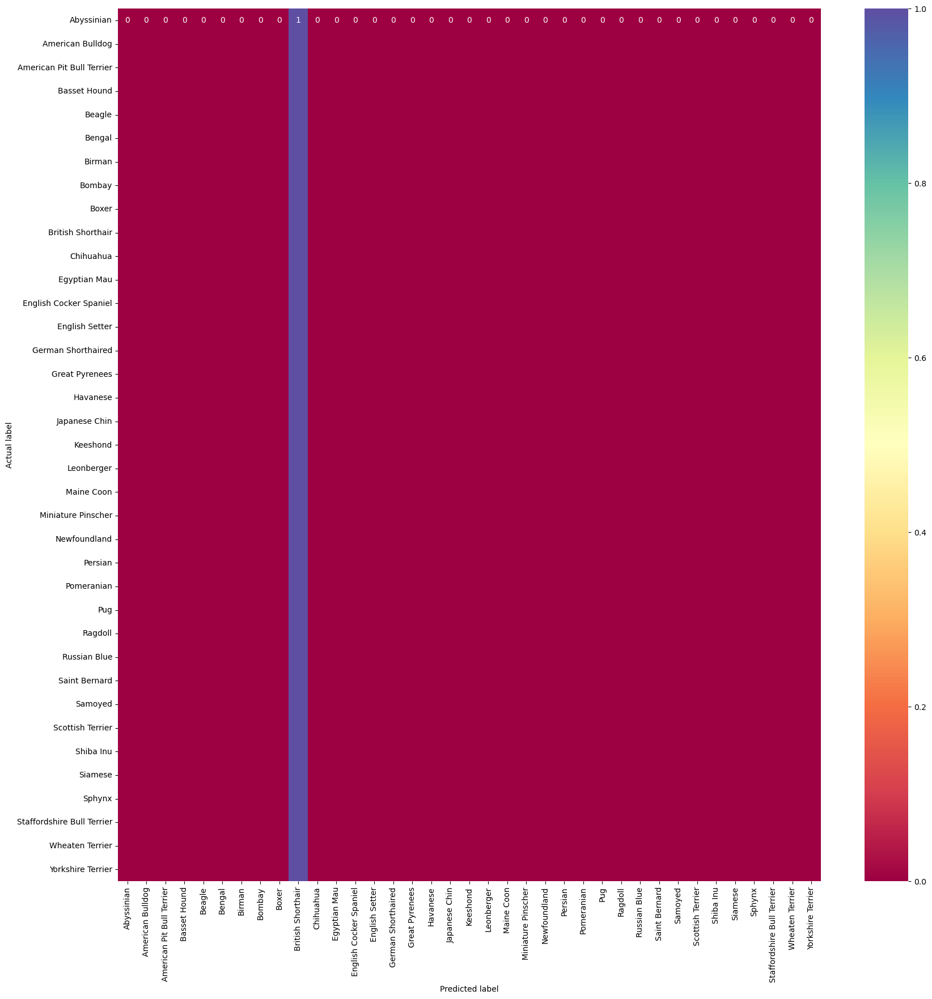

In [17]:
import seaborn as sns
cmat = confmat.compute().cpu().numpy()

fig, ax = plt.subplots(figsize=(20,20))

df_cm = pd.DataFrame(cmat, index = range(len(classes)), columns=range(len(classes)))
ax = sns.heatmap(df_cm, annot=True, fmt='.2g', cmap='Spectral')
ax.set_yticklabels([classes[i] for i in range(len(classes))], rotation=0)
ax.set_xticklabels([classes[i] for i in range(len(classes))], rotation=90)
ax.set_xlabel("Predicted label")
ax.set_ylabel("Actual label")
plt.show(block=False)

#### 전이 학습

##### 1. 모델 구축

In [18]:
from torchvision import models

In [19]:
seed_everything(2023, workers=True)

# Define pre_VGGNet Class
class pre_VGGNet(LightningModule):
    def __init__(self, model, num_classes=10, learning_rate=0.001, init_weights=True):
        super().__init__()
        self.save_hyperparameters()

        # Setup VGGNet model
        self.create_model(model)

        # 전이 학습에서 update할 파라미터 정의
        params_to_update = []
        update_params = ['classifier.6.weight', 'classifier.6.bias']
        # 이외 파라미터 계산 및 update 없도록 설정
        for name, param in self.model.named_parameters():
            if name in update_params:
              param.requires_grad = True
              params_to_update.append(param)
            else:
              param.requires_grad = False
        self.update_parameters = params_to_update

        # Setup the loss
        self.loss = nn.CrossEntropyLoss()

        # Setup the metrics.
        self.train_metrics = MetricCollection({"train_acc" : Accuracy(task="multiclass", num_classes=num_classes, average="micro"),
                                               "train_f1" : F1Score(task="multiclass", num_classes=num_classes, average="macro")})
        self.val_metrics = MetricCollection({"val_acc" : Accuracy(task="multiclass", num_classes=num_classes, average="micro"),
                                               "val_f1" : F1Score(task="multiclass", num_classes=num_classes, average="macro")})
        self.test_metrics = MetricCollection({"test_acc" : Accuracy(task="multiclass", num_classes=num_classes, average="micro"),
                                               "test_f1" : F1Score(task="multiclass", num_classes=num_classes, average="macro")})
    
    def create_model(self, model):
        if model == 'VGG11':
          self.model = models.vgg11(pretrained=True)
        elif model == 'VGG13':
          self.model = models.vgg13(pretrained=True)
        elif model == 'VGG16':
          self.model = models.vgg16(pretrained=True)
        elif model == 'VGG19':
          self.model = models.vgg19(pretrained=True)
        # 데이터의 class 수에 맞게 classifier 마지막 부분 수정
        self.model.classifier[6] = nn.Linear(4096, num_classes)
        # 훈련 모드 설정
        self.model.train()

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        images, labels = batch

        logits = self(images)
        preds = torch.argmax(logits, dim=1)
        loss = self.loss(logits, labels)

        self.train_metrics(preds, labels)

        self.log("train_acc", self.train_metrics["train_acc"], prog_bar=True)
        self.log("train_f1", self.train_metrics["train_f1"], prog_bar=True)
        self.log("train_loss", loss, prog_bar=True)

        return loss

    def evaluate(self, batch, stage=None):
        images, labels = batch

        logits = self(images)
        preds = torch.argmax(logits, dim=1)
        loss = nn.CrossEntropyLoss()(logits, labels)

        if stage == "val":
            self.val_metrics(preds,labels)

            self.log("val_acc", self.val_metrics["val_acc"], prog_bar=True)
            self.log("val_f1", self.val_metrics["val_f1"], prog_bar=True)
            self.log("val_loss", loss, prog_bar=True)
        elif stage == "test":
            self.test_metrics(preds,labels)

            self.log("test_acc", self.test_metrics["test_acc"], prog_bar=True)
            self.log("test_f1", self.test_metrics["test_f1"], prog_bar=True)
            self.log("test_loss", loss, prog_bar=True)

    def validation_step(self, batch, batch_idx):
        return self.evaluate(batch, "val")

    def test_step(self, batch, batch_idx):
        return self.evaluate(batch, "test")

    def configure_optimizers(self):
        optimizer = torch.optim.Adam(params=self.update_parameters, lr=self.hparams.learning_rate)
        scheduler = StepLR(optimizer, step_size=30, gamma=0.1)
        return [optimizer], [scheduler]


Seed set to 2023


In [20]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cuda


In [21]:
pre_model = pre_VGGNet('VGG16', num_classes=num_classes, learning_rate=0.001).to(device)
print(pre_model)

c:\Users\Hyosk5\miniconda3\envs\torch\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\Hyosk5\miniconda3\envs\torch\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


pre_VGGNet(
  (model): VGG(
    (features): Sequential(
      (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (3): ReLU(inplace=True)
      (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (6): ReLU(inplace=True)
      (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (8): ReLU(inplace=True)
      (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (11): ReLU(inplace=True)
      (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (13): ReLU(inplace=True)
      (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (15): ReLU(inplace=True)
      (16

In [22]:
summary(pre_model, input_size=(3, 224, 224), device=device.type)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 224, 224]           1,792
              ReLU-2         [-1, 64, 224, 224]               0
            Conv2d-3         [-1, 64, 224, 224]          36,928
              ReLU-4         [-1, 64, 224, 224]               0
         MaxPool2d-5         [-1, 64, 112, 112]               0
            Conv2d-6        [-1, 128, 112, 112]          73,856
              ReLU-7        [-1, 128, 112, 112]               0
            Conv2d-8        [-1, 128, 112, 112]         147,584
              ReLU-9        [-1, 128, 112, 112]               0
        MaxPool2d-10          [-1, 128, 56, 56]               0
           Conv2d-11          [-1, 256, 56, 56]         295,168
             ReLU-12          [-1, 256, 56, 56]               0
           Conv2d-13          [-1, 256, 56, 56]         590,080
             ReLU-14          [-1, 256,

##### 2. 모델 학습

In [23]:
from pytorch_lightning.callbacks import LearningRateMonitor

In [24]:
callbacks = [LearningRateMonitor(logging_interval='step')]

trainer = Trainer(
            accelerator='gpu',
            max_epochs=20,
            callbacks=callbacks,
          )

trainer.fit(pre_model,
            train_dataloaders=train_dataloader,
            val_dataloaders=val_dataloader)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



  | Name          | Type             | Params
---------------------------------------------------
0 | model         | VGG              | 134 M 
1 | loss          | CrossEntropyLoss | 0     
2 | train_metrics | MetricCollection | 0     
3 | val_metrics   | MetricCollection | 0     
4 | test_metrics  | MetricCollection | 0     
---------------------------------------------------
151 K     Trainable params
134 M     Non-trainable params
134 M     Total params
537.649   Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

c:\Users\Hyosk5\miniconda3\envs\torch\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


c:\Users\Hyosk5\miniconda3\envs\torch\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


Epoch 19: 100%|██████████| 52/52 [00:13<00:00,  3.86it/s, v_num=11, train_acc=0.958, train_f1=0.877, train_loss=0.220, val_acc=0.812, val_f1=0.803, val_loss=0.607] 

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 19: 100%|██████████| 52/52 [00:17<00:00,  3.05it/s, v_num=11, train_acc=0.958, train_f1=0.877, train_loss=0.220, val_acc=0.812, val_f1=0.803, val_loss=0.607]


In [ ]:
%load_ext tensorboard
%tensorboard --logdir=./lightning_logs --bind_all

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 27816), started 0:00:27 ago. (Use '!kill 27816' to kill it.)

##### 3. 모델 결과

In [26]:
pre_best_model_path = trainer.checkpoint_callback.best_model_path
pre_best_model = pre_VGGNet.load_from_checkpoint(pre_best_model_path)

In [27]:
trainer.test(pre_best_model, dataloaders=test_dataloader)

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\Users\Hyosk5\miniconda3\envs\torch\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'test_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


Testing DataLoader 0: 100%|██████████| 6/6 [00:01<00:00,  5.02it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc                  0.8125
         test_f1            0.8033485412597656
        test_loss           0.6071589589118958
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


[{'test_acc': 0.8125,
  'test_f1': 0.8033485412597656,
  'test_loss': 0.6071589589118958}]

In [28]:
from torchmetrics import ConfusionMatrix

confmat = ConfusionMatrix(task='multiclass', num_classes=num_classes, normalize='true')
prev_device = pre_best_model.device.type
device = torch.device("cuda" if torch.cuda.is_available else "cpu")

confmat.to(device)
pre_best_model.to(device)
with torch.no_grad():
    pre_best_model.eval()

    for batch in test_dataloader:
        images, labels = batch
        images, labels = images.to(device), labels.to(device)

        logits = pre_best_model(images)
        preds = torch.argmax(logits, dim=1)

        confmat.update(preds, labels)

pre_best_model.to(prev_device)
1

1

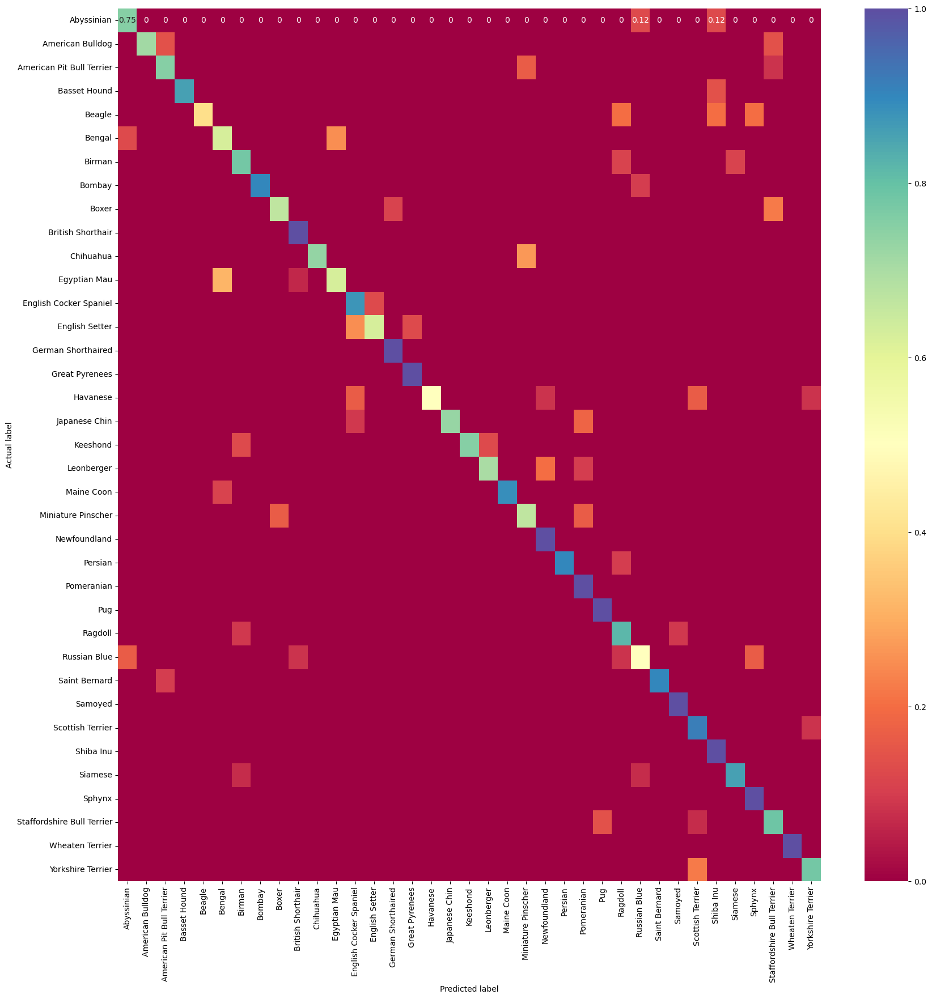

In [29]:
import seaborn as sns
cmat = confmat.compute().cpu().numpy()

fig, ax = plt.subplots(figsize=(20,20))

df_cm = pd.DataFrame(cmat, index = range(len(classes)), columns=range(len(classes)))
ax = sns.heatmap(df_cm, annot=True, fmt='.2g', cmap='Spectral')
ax.set_yticklabels([classes[i] for i in range(len(classes))], rotation=0)
ax.set_xticklabels([classes[i] for i in range(len(classes))], rotation=90)
ax.set_xlabel("Predicted label")
ax.set_ylabel("Actual label")
plt.show(block=False)